<a href="https://colab.research.google.com/github/juanfran18gc-code/jfMIAAD/blob/08-Semana/Practica20_261554.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Autor: Juan Francisco Gámez Cortés.
Matricula: 261554

Última Modificación: 04 de octubre de 2025

# Práctica #20: Ejercicios con EDA 1
# Objetivo:
Realizar el Análisis Exploratorio de Datos del conjunto Air Quality

## Descripción del conjunto de datos:


Utiliza el conjunto de datos "Air Quality" disponible al final de esta practica. Este conjunto contiene datos horarios de sensores de calidad del aire, incluyendo niveles de CO, NOx, y otros contaminantes. El conjunto de datos tiene valores faltantes y columnas categóricas (por ejemplo, el día de la semana).

# Instrucciones para los estudiantes:

1. Descargar el archivo AirQuality.csv desde el enlace proporcionado.

In [2]:
#Montar google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

#Cargar el dataset AirQuality, usamos separador de ;
df = pd.read_csv('/content/drive/MyDrive/Unidad02/AirQuality.csv',sep=';', decimal=',',)

#Filtrar columnas Unnamed
df = df.drop(columns=df.filter(regex='^Unnamed').columns)

# Convertir Date al tipo fecha correcto
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y', errors='coerce')

# Convertir Time al tipo hora correcto
df['Time'] = pd.to_datetime(df['Time'], format='%H.%M.%S', errors='coerce').dt.time

#Observar las columnas y datos del dataframe
print(df.head())
print(df.tail())

print('\n',df.dtypes)

# Eliminar datos faltantes NaN o NaT
df = df.dropna()
print("Valores faltantes:\n",df.isnull().sum())

#Observar las columnas y datos del dataframe sin NaN o NaT
print(df.head())
print(df.tail())


        Date      Time  CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  \
0 2004-03-10  18:00:00     2.6       1360.0     150.0      11.9   
1 2004-03-10  19:00:00     2.0       1292.0     112.0       9.4   
2 2004-03-10  20:00:00     2.2       1402.0      88.0       9.0   
3 2004-03-10  21:00:00     2.2       1376.0      80.0       9.2   
4 2004-03-10  22:00:00     1.6       1272.0      51.0       6.5   

   PT08.S2(NMHC)  NOx(GT)  PT08.S3(NOx)  NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)  \
0         1046.0    166.0        1056.0    113.0        1692.0       1268.0   
1          955.0    103.0        1174.0     92.0        1559.0        972.0   
2          939.0    131.0        1140.0    114.0        1555.0       1074.0   
3          948.0    172.0        1092.0    122.0        1584.0       1203.0   
4          836.0    131.0        1205.0    116.0        1490.0       1110.0   

      T    RH      AH  
0  13.6  48.9  0.7578  
1  13.3  47.7  0.7255  
2  11.9  54.0  0.7502  
3  11.0  60.0  0.7867  
4 

## 2.  Realizar un EDA completo, incluyendo:

* Descripción de los datos (medias, medianas, desviaciones estándar, etc.).

In [27]:
# Estadísticos básicos

# Obtener columnas numéricas
col_numericas = df.select_dtypes(include=['number']).columns.tolist()

print("Tipos de dato por columna:\n")
print(df.info())
print("Estadístos básicos:\n",df[col_numericas].describe())

moda = df.mode().iloc[0]  # .iloc[0] toma solo el primer valor en caso de múltiples modas
varianza = df[col_numericas].var() #solo variables numericas

# Mostrar la moda de cada columna
print("\nModa de cada columna:")
print(moda)
print('\n')

# Mostrar la varianza de cada columna
print("Varianza de cada columna:")
print(varianza)
print('\n')

# Verificar valores faltantes
print("Valores faltantes:\n",df.isnull().sum())


Tipos de dato por columna:

<class 'pandas.core.frame.DataFrame'>
Index: 9357 entries, 0 to 9356
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           9357 non-null   datetime64[ns]
 1   Time           9357 non-null   object        
 2   CO(GT)         9357 non-null   float64       
 3   PT08.S1(CO)    9357 non-null   float64       
 4   NMHC(GT)       9357 non-null   float64       
 5   C6H6(GT)       9357 non-null   float64       
 6   PT08.S2(NMHC)  9357 non-null   float64       
 7   NOx(GT)        9357 non-null   float64       
 8   PT08.S3(NOx)   9357 non-null   float64       
 9   NO2(GT)        9357 non-null   float64       
 10  PT08.S4(NO2)   9357 non-null   float64       
 11  PT08.S5(O3)    9357 non-null   float64       
 12  T              9357 non-null   float64       
 13  RH             9357 non-null   float64       
 14  AH             9357 non-null   float64       
 15

### Histogramas para las columnas numéricas.

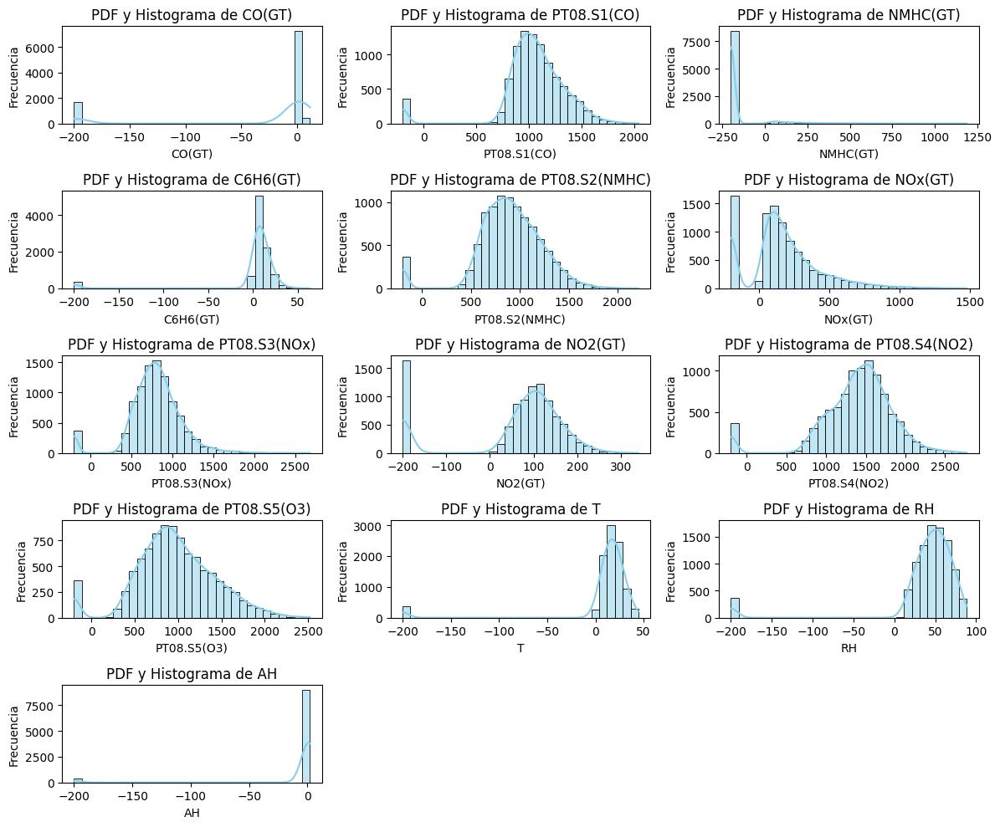

In [28]:
# Crear los gráficos de PDF e Histograma

plt.figure(figsize=(12, 10))
for i, col in enumerate(col_numericas, 1):
    plt.subplot(5, 3, i)  # Ajustar la cantidad de subgráficos según el número de columnas
    sns.histplot(df[col], kde=True, bins=30, color='skyblue')
    plt.title(f'PDF y Histograma de {col}', fontsize=12)
    plt.xlabel(col, fontsize=10)
    plt.ylabel('Frecuencia', fontsize=10)

plt.tight_layout()
plt.show()

### De la columna Date obten el día de la Semana y realiza una gráfica de barras.

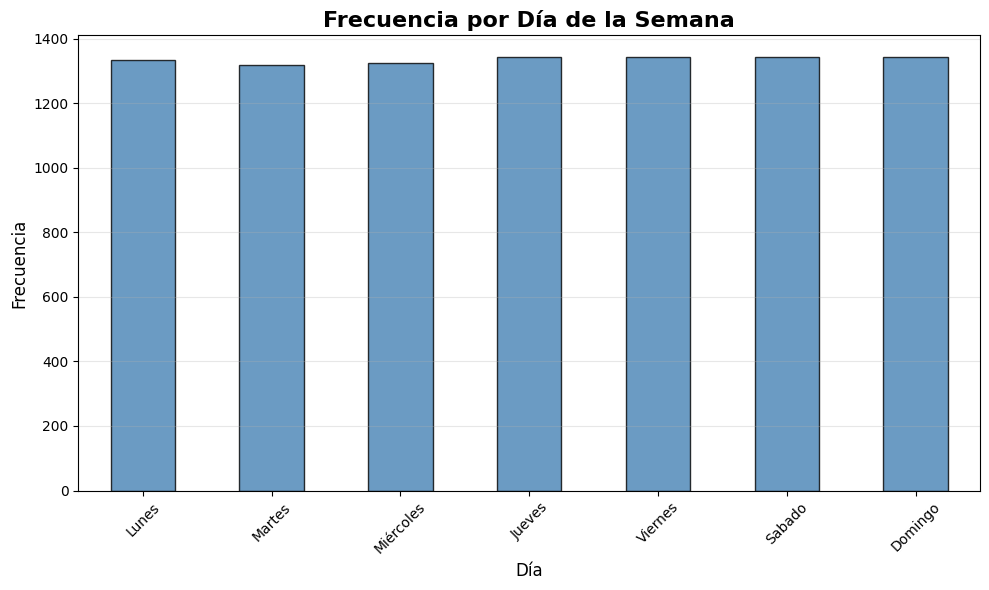

In [29]:
#Obtener el día de la semana
df['dia_semana'] = df['Date'].dt.day_of_week

#Mapear los días de la semana a texto
dias_semana = {
    0: "Lunes",
    1: "Martes",
    2: "Miércoles",
    3: "Jueves",
    4: "Viernes",
    5: "Sabado",
    6: "Domingo",
}

df['dia_semana'] = df['dia_semana'].map(dias_semana)

# Contar frecuencia por día
conteo = df['dia_semana'].value_counts().reindex(dias_semana.values())

# Grafico de barras
plt.figure(figsize=(10, 6))
conteo.plot(kind='bar', color='steelblue', edgecolor='black', alpha=0.8)
plt.title('Frecuencia por Día de la Semana', fontsize=16, weight='bold')
plt.xlabel('Día', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()


In [30]:
print('Frecuencia de días de la semana:\n', conteo)

Frecuencia de días de la semana:
 dia_semana
Lunes        1335
Martes       1320
Miércoles    1326
Jueves       1344
Viernes      1344
Sabado       1344
Domingo      1344
Name: count, dtype: int64


### Boxplots para identificar outliers en las columnas numéricas.

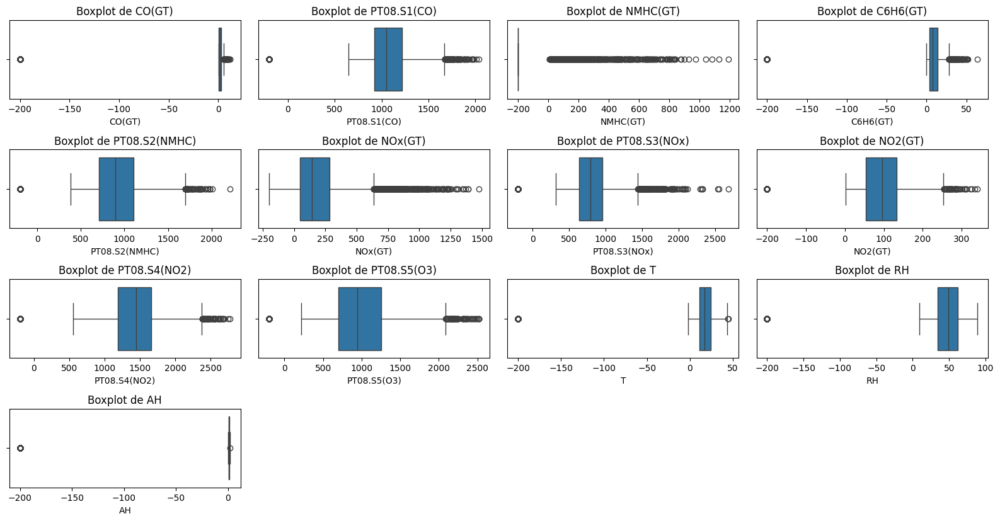

In [31]:
# Configurar el tamaño de la figura
plt.figure(figsize=(16, 10))

# Crear boxplots para cada columna numérica
for i, col in enumerate(col_numericas, 1):
    plt.subplot(5, 4, i)  # 2 filas, 4 columnas de subplots
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot de {col}')
plt.tight_layout()
plt.show()


### Matriz de correlación y mapa de calor.

Matriz de correlación:
                 CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  PT08.S2(NMHC)  \
CO(GT)         1.000000     0.041411  0.128351 -0.031378       0.029926   
PT08.S1(CO)    0.041411     1.000000  0.170007  0.852687       0.933102   
NMHC(GT)       0.128351     0.170007  1.000000  0.037323       0.110104   
C6H6(GT)      -0.031378     0.852687  0.037323  1.000000       0.767433   
PT08.S2(NMHC)  0.029926     0.933102  0.110104  0.767433       1.000000   
NOx(GT)        0.526451     0.277993 -0.004427 -0.001174       0.331272   
PT08.S3(NOx)  -0.089981     0.087019  0.048821  0.512193      -0.073667   
NO2(GT)        0.671127     0.154030  0.103307 -0.010992       0.176488   
PT08.S4(NO2)  -0.073724     0.845149  0.162680  0.774673       0.874782   
PT08.S5(O3)    0.080310     0.892434  0.101185  0.641334       0.909905   
T             -0.068939     0.754844 -0.000009  0.971375       0.669025   
RH            -0.048227     0.745375  0.008284  0.925062       0.585803   
AH

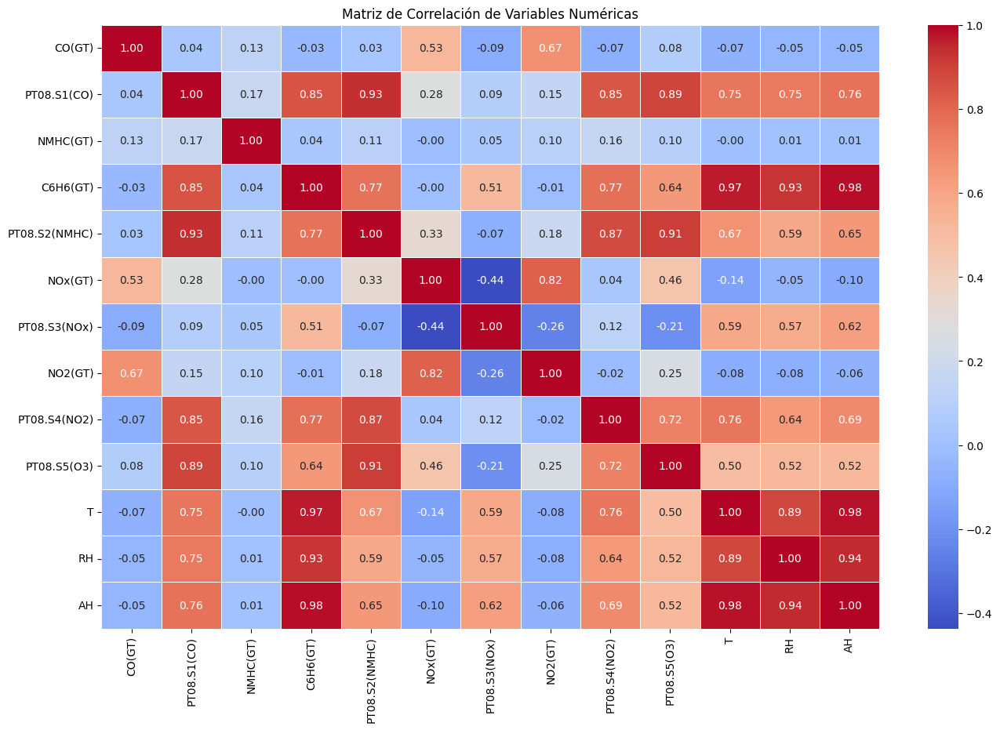

In [32]:
# Seleccionar solo las columnas numéricas
numeric_columns = df.select_dtypes(include=[np.number])

# Calcular la matriz de correlación
corr_matrix = numeric_columns.corr()

# Mostrar la matriz de correlación
print("Matriz de correlación:")
print(corr_matrix)

# Visualizar la matriz de correlación con un heatmap
plt.figure(figsize=(16, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Matriz de Correlación de Variables Numéricas')
plt.show()

### Pairplot para visualizar relaciones entre variables numéricas.

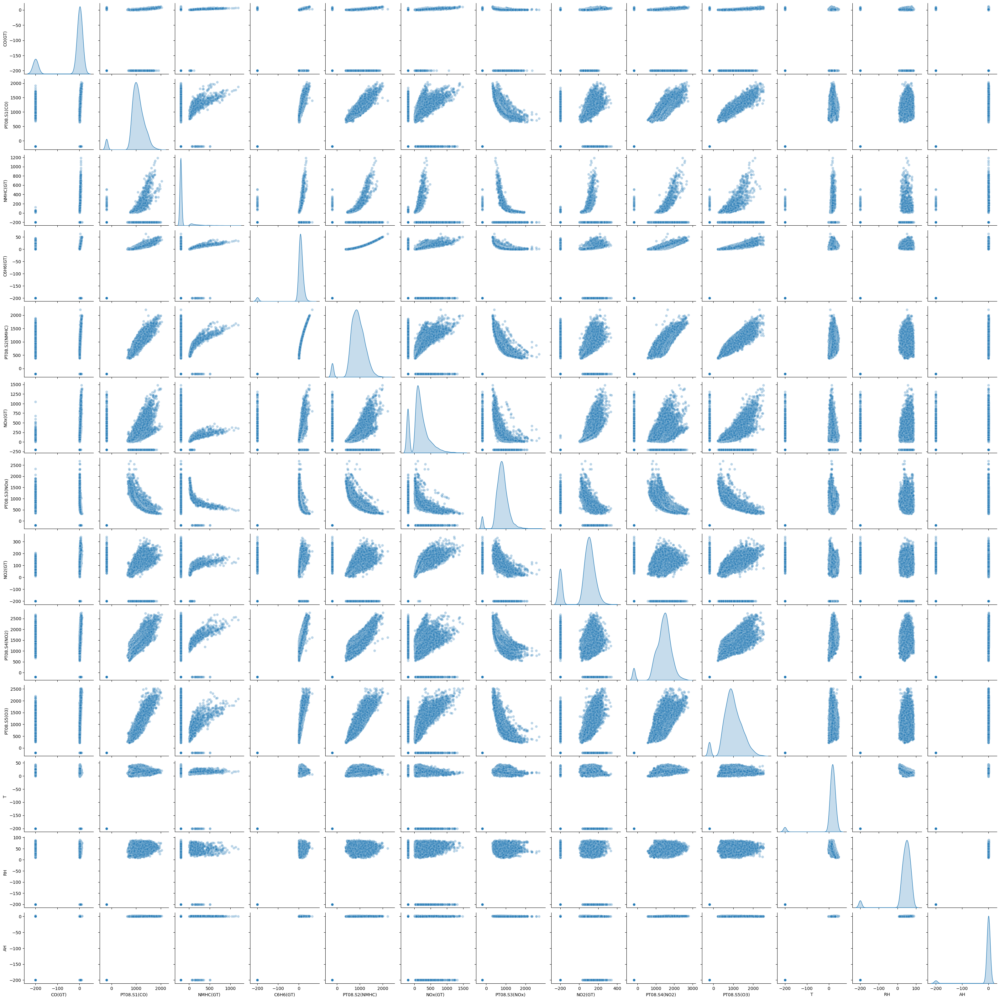

In [33]:
# Crear un scatterplot para todas las combinaciones de variables numéricas
sns.pairplot(df[col_numericas], plot_kws={'alpha': 0.3}, diag_kind='kde')

# Mostrar el gráfico
plt.show()

### Pruebas de normalidad (Shapiro-Wilk, Anderson-Darling, Kolmogorov-Smirnov) y QQplot para las columnas numéricas.

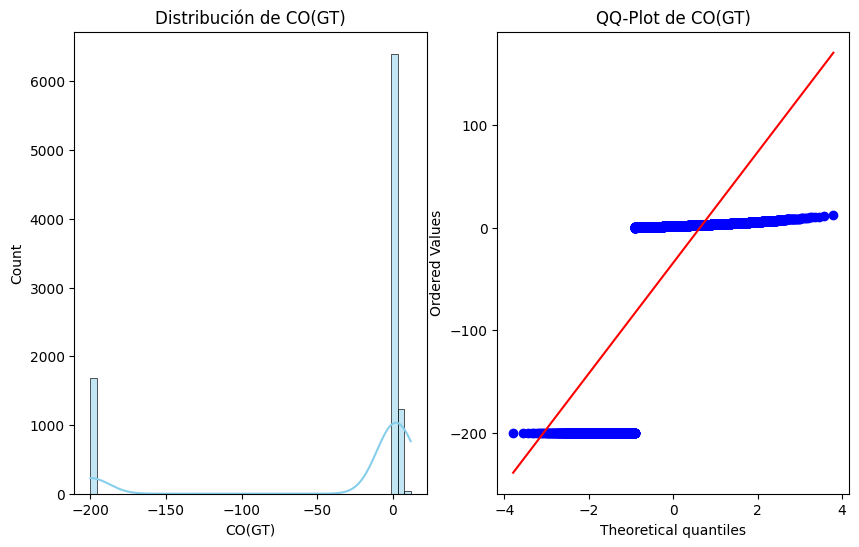


Pruebas de normalidad para la columna: CO(GT)
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 2501.15334
  Al nivel de significancia 15.0%, los datos NO parecen normales.

  Al nivel de significancia 10.0%, los datos NO parecen normales.

  Al nivel de significancia 5.0%, los datos NO parecen normales.

  Al nivel de significancia 2.5%, los datos NO parecen normales.

  Al nivel de significancia 1.0%, los datos NO parecen normales.



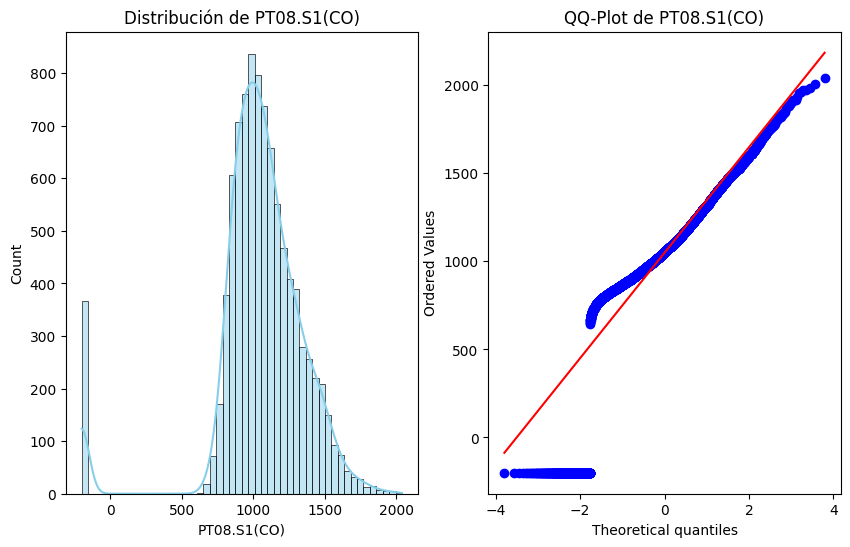


Pruebas de normalidad para la columna: PT08.S1(CO)
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 355.41246
  Al nivel de significancia 15.0%, los datos NO parecen normales.

  Al nivel de significancia 10.0%, los datos NO parecen normales.

  Al nivel de significancia 5.0%, los datos NO parecen normales.

  Al nivel de significancia 2.5%, los datos NO parecen normales.

  Al nivel de significancia 1.0%, los datos NO parecen normales.



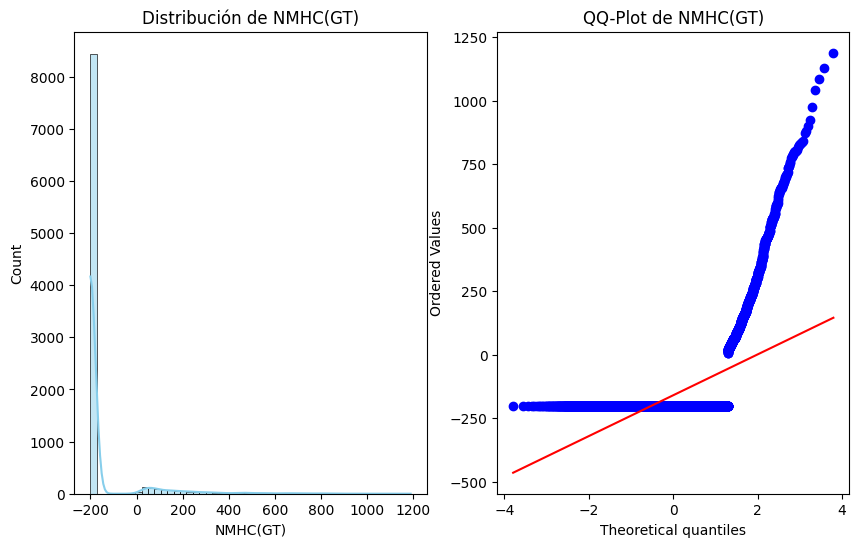


Pruebas de normalidad para la columna: NMHC(GT)
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 2820.94917
  Al nivel de significancia 15.0%, los datos NO parecen normales.

  Al nivel de significancia 10.0%, los datos NO parecen normales.

  Al nivel de significancia 5.0%, los datos NO parecen normales.

  Al nivel de significancia 2.5%, los datos NO parecen normales.

  Al nivel de significancia 1.0%, los datos NO parecen normales.



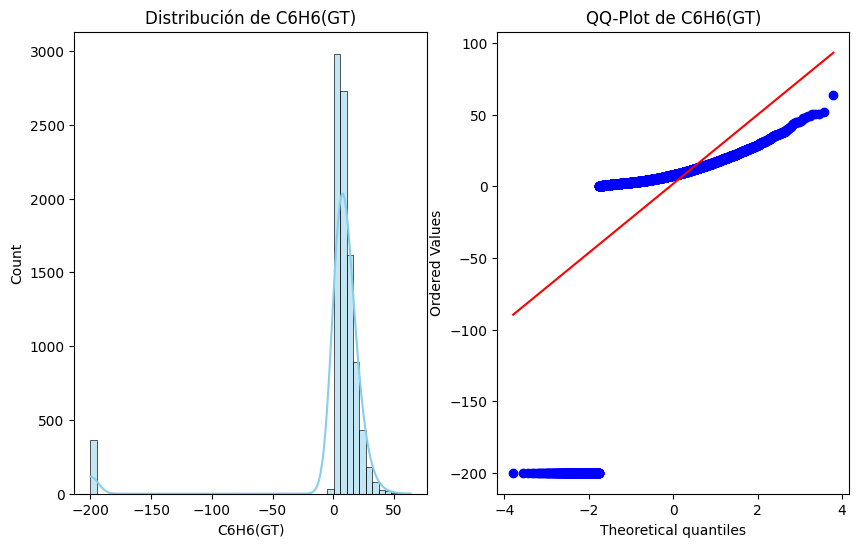


Pruebas de normalidad para la columna: C6H6(GT)
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 2272.58484
  Al nivel de significancia 15.0%, los datos NO parecen normales.

  Al nivel de significancia 10.0%, los datos NO parecen normales.

  Al nivel de significancia 5.0%, los datos NO parecen normales.

  Al nivel de significancia 2.5%, los datos NO parecen normales.

  Al nivel de significancia 1.0%, los datos NO parecen normales.



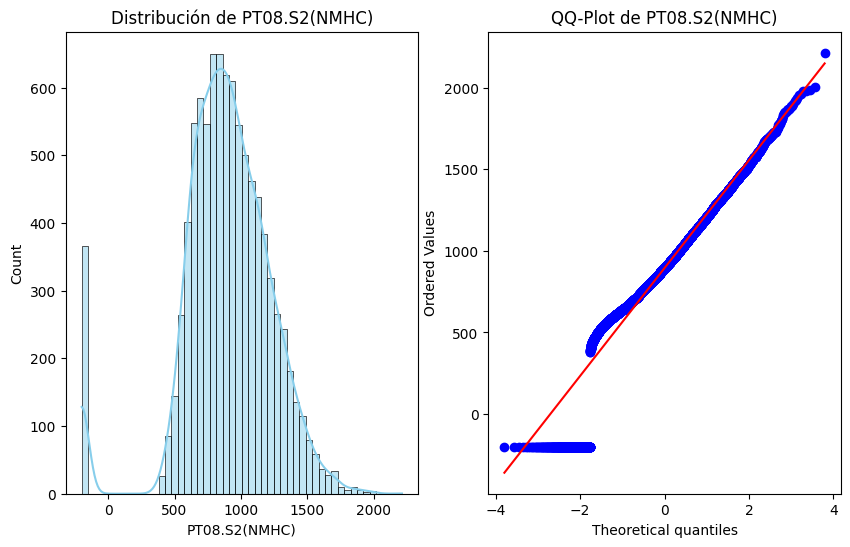


Pruebas de normalidad para la columna: PT08.S2(NMHC)
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 119.20819
  Al nivel de significancia 15.0%, los datos NO parecen normales.

  Al nivel de significancia 10.0%, los datos NO parecen normales.

  Al nivel de significancia 5.0%, los datos NO parecen normales.

  Al nivel de significancia 2.5%, los datos NO parecen normales.

  Al nivel de significancia 1.0%, los datos NO parecen normales.



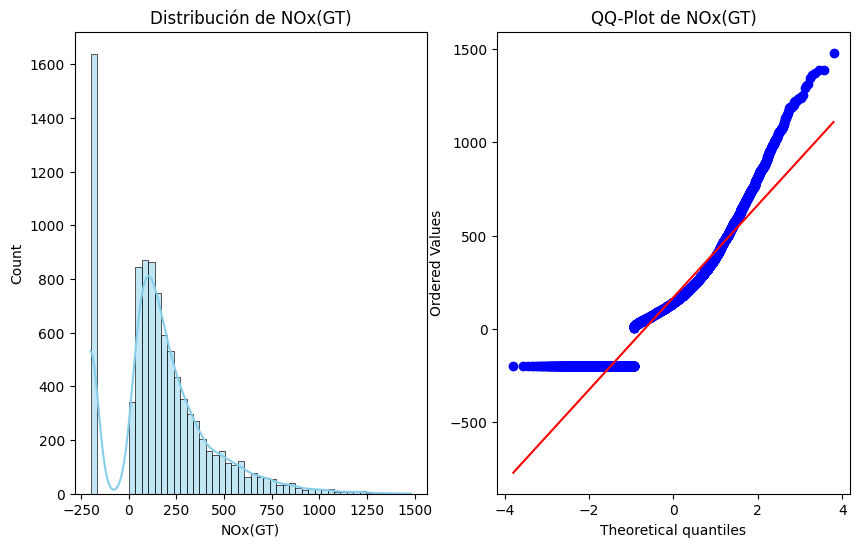


Pruebas de normalidad para la columna: NOx(GT)
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 188.79429
  Al nivel de significancia 15.0%, los datos NO parecen normales.

  Al nivel de significancia 10.0%, los datos NO parecen normales.

  Al nivel de significancia 5.0%, los datos NO parecen normales.

  Al nivel de significancia 2.5%, los datos NO parecen normales.

  Al nivel de significancia 1.0%, los datos NO parecen normales.



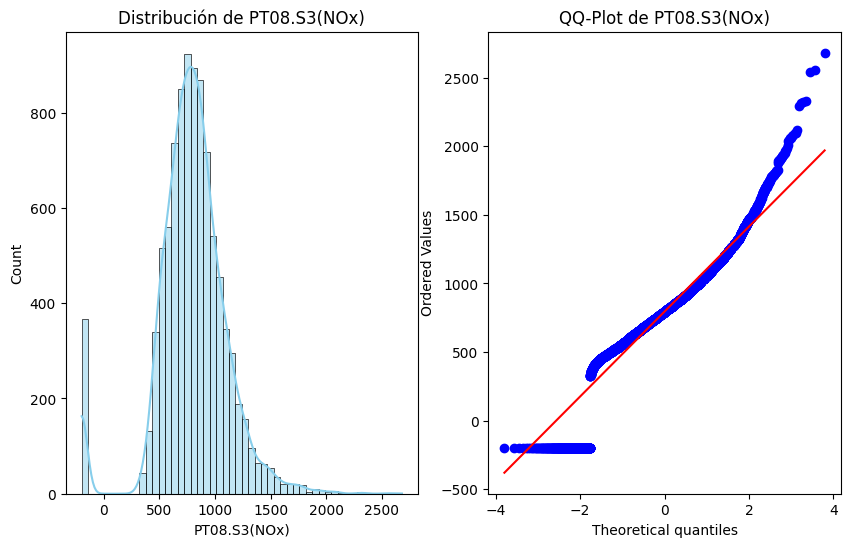


Pruebas de normalidad para la columna: PT08.S3(NOx)
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 159.03112
  Al nivel de significancia 15.0%, los datos NO parecen normales.

  Al nivel de significancia 10.0%, los datos NO parecen normales.

  Al nivel de significancia 5.0%, los datos NO parecen normales.

  Al nivel de significancia 2.5%, los datos NO parecen normales.

  Al nivel de significancia 1.0%, los datos NO parecen normales.



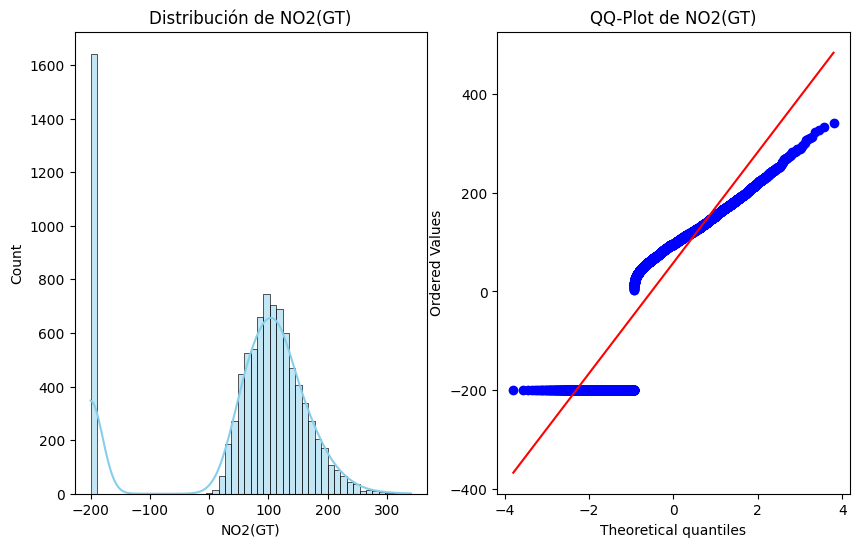


Pruebas de normalidad para la columna: NO2(GT)
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 894.66163
  Al nivel de significancia 15.0%, los datos NO parecen normales.

  Al nivel de significancia 10.0%, los datos NO parecen normales.

  Al nivel de significancia 5.0%, los datos NO parecen normales.

  Al nivel de significancia 2.5%, los datos NO parecen normales.

  Al nivel de significancia 1.0%, los datos NO parecen normales.



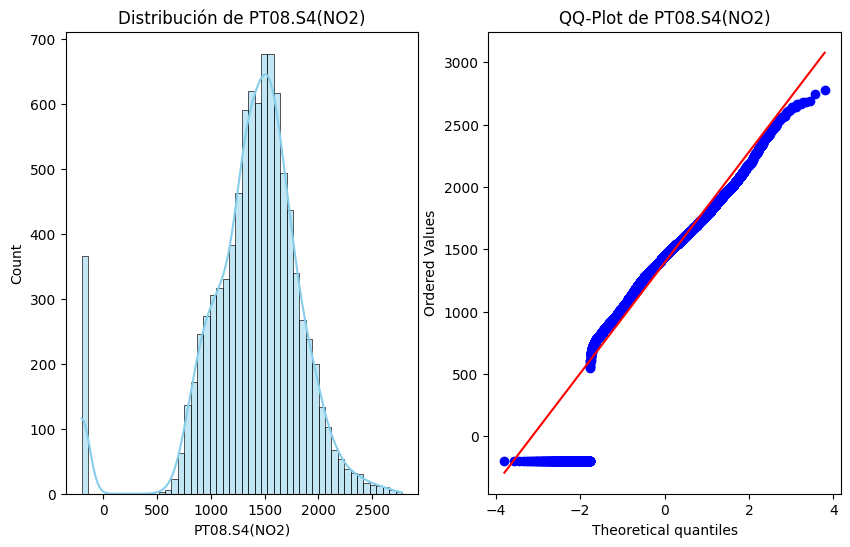


Pruebas de normalidad para la columna: PT08.S4(NO2)
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 183.34158
  Al nivel de significancia 15.0%, los datos NO parecen normales.

  Al nivel de significancia 10.0%, los datos NO parecen normales.

  Al nivel de significancia 5.0%, los datos NO parecen normales.

  Al nivel de significancia 2.5%, los datos NO parecen normales.

  Al nivel de significancia 1.0%, los datos NO parecen normales.



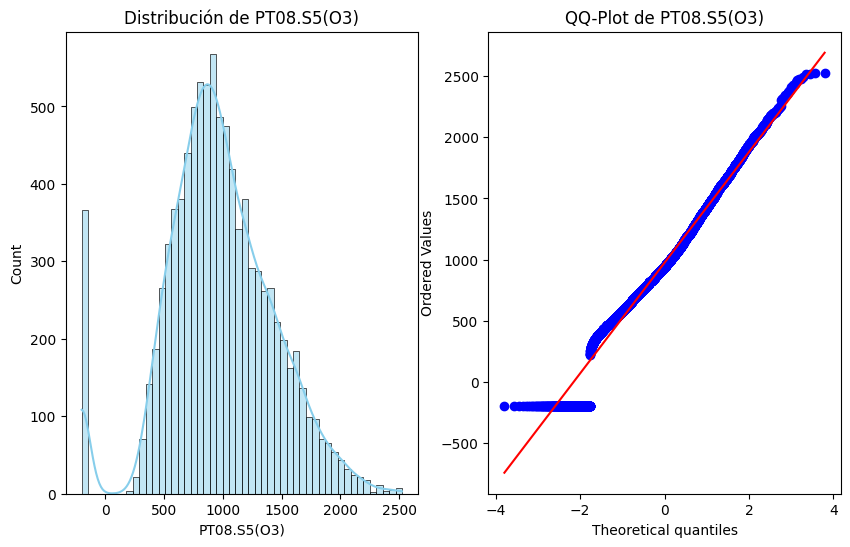


Pruebas de normalidad para la columna: PT08.S5(O3)
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 45.68234
  Al nivel de significancia 15.0%, los datos NO parecen normales.

  Al nivel de significancia 10.0%, los datos NO parecen normales.

  Al nivel de significancia 5.0%, los datos NO parecen normales.

  Al nivel de significancia 2.5%, los datos NO parecen normales.

  Al nivel de significancia 1.0%, los datos NO parecen normales.



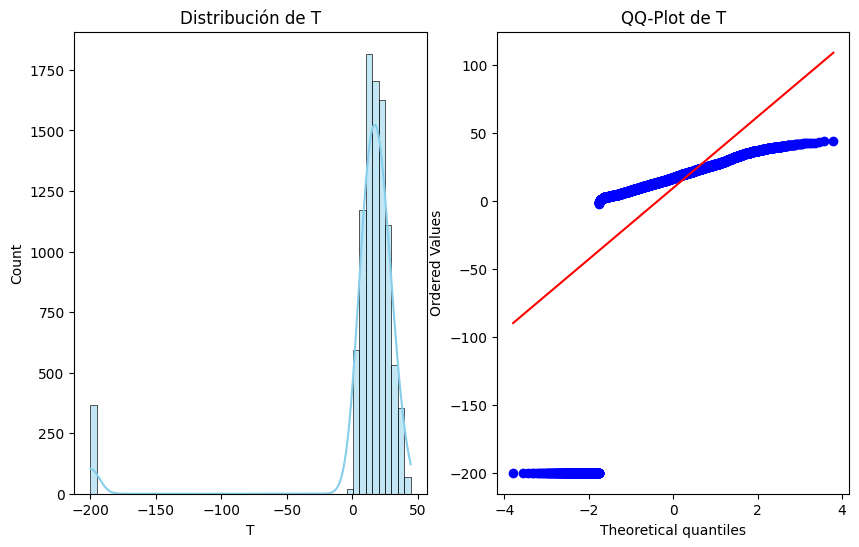


Pruebas de normalidad para la columna: T
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 2041.45858
  Al nivel de significancia 15.0%, los datos NO parecen normales.

  Al nivel de significancia 10.0%, los datos NO parecen normales.

  Al nivel de significancia 5.0%, los datos NO parecen normales.

  Al nivel de significancia 2.5%, los datos NO parecen normales.

  Al nivel de significancia 1.0%, los datos NO parecen normales.



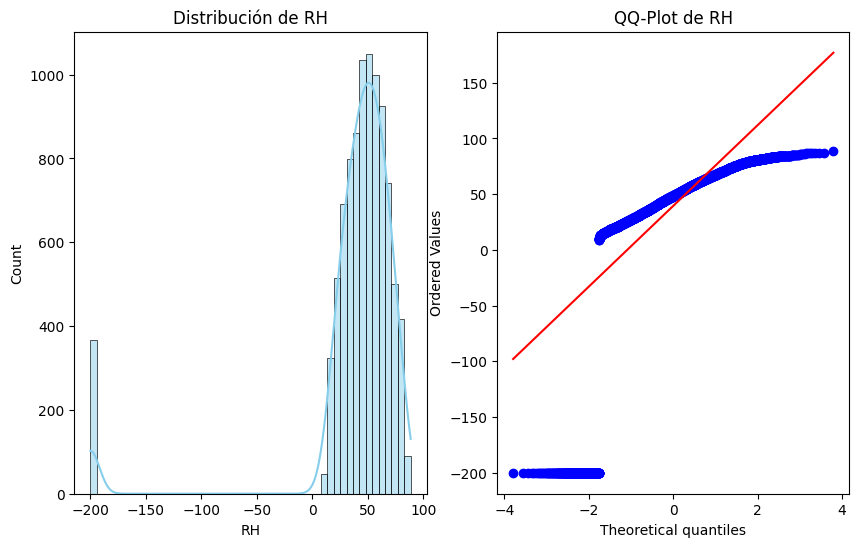


Pruebas de normalidad para la columna: RH
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 1329.04460
  Al nivel de significancia 15.0%, los datos NO parecen normales.

  Al nivel de significancia 10.0%, los datos NO parecen normales.

  Al nivel de significancia 5.0%, los datos NO parecen normales.

  Al nivel de significancia 2.5%, los datos NO parecen normales.

  Al nivel de significancia 1.0%, los datos NO parecen normales.



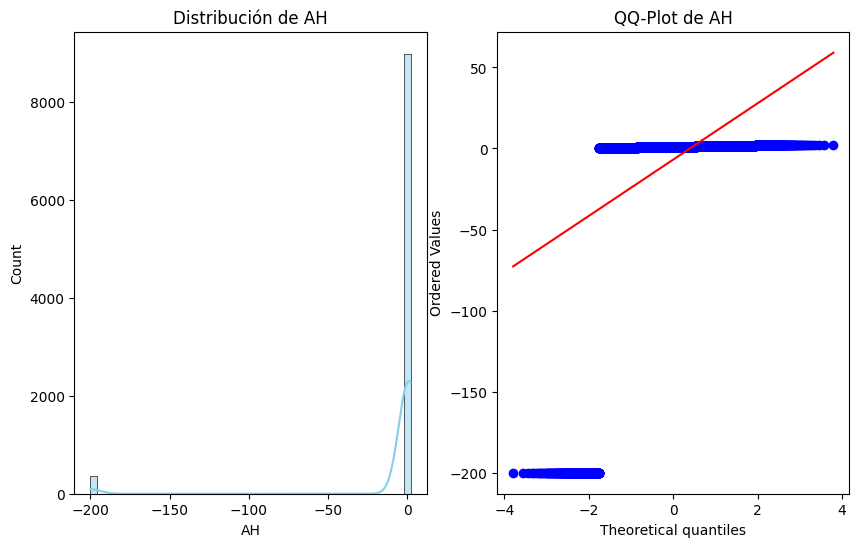


Pruebas de normalidad para la columna: AH
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 3357.68062
  Al nivel de significancia 15.0%, los datos NO parecen normales.

  Al nivel de significancia 10.0%, los datos NO parecen normales.

  Al nivel de significancia 5.0%, los datos NO parecen normales.

  Al nivel de significancia 2.5%, los datos NO parecen normales.

  Al nivel de significancia 1.0%, los datos NO parecen normales.



In [34]:
#===================================
#FUNCIONES DE PRUEBAS DE NORMALIDAD#
#===================================

# Función para realizar pruebas de normalidad
def normality_tests(data, column_name):
    print(f"\nPruebas de normalidad para la columna: {column_name}")

    # Prueba de Shapiro-Wilk
    shapiro_test = stats.shapiro(data.sample(min(5000, len(data)), random_state=42))  # Muestra de 5000 para evitar problemas de cómputo
    print(f"Shapiro-Wilk Test: p-valor = {shapiro_test.pvalue:.5f}")

    # Prueba de Kolmogorov-Smirnov
    ks_test = stats.kstest(data, 'norm', args=(data.mean(), data.std()))
    print(f"Kolmogorov-Smirnov Test: p-valor = {ks_test.pvalue:.5f}")

    # Prueba de Anderson-Darling
    anderson_test = stats.anderson(data, dist='norm')
    print(f"Anderson-Darling Test: Estadístico = {anderson_test.statistic:.5f}")
    for i in range(len(anderson_test.critical_values)):
        sl, cv = anderson_test.significance_level[i], anderson_test.critical_values[i]
        if anderson_test.statistic < cv:
            print(f"  Al nivel de significancia {sl}%, los datos parecen normales.")
        else:
            print(f"  Al nivel de significancia {sl}%, los datos NO parecen normales.\n")

# Función para graficar histograma y QQ-Plot
def plot_distribution(data, column_name):
    plt.figure(figsize=(10, 6))

    # Histograma
    plt.subplot(1, 2, 1)
    sns.histplot(data, bins=50, kde=True, color="skyblue")
    plt.title(f"Distribución de {column_name}")

    # QQ-Plot
    plt.subplot(1, 2, 2)
    stats.probplot(data, dist="norm", plot=plt)
    plt.title(f"QQ-Plot de {column_name}")
    plt.show()

#===USO DE FUNCIONES DE NORMALIDAD===
for column in numeric_columns:
    data = df[column]
    plot_distribution(data, column)
    normality_tests(data, column)



## 3. Identificar y tratar los datos faltantes utilizando técnicas como imputación por media, mediana o moda, o eliminación de filas/columnas según sea apropiado.

In [35]:
print('ANTES DEL TRATAMIENTO:')
print(f"Valores -200 totales: {(df == -200).sum().sum():,}")
print(f"Valores distintos de -200 totales: {(df != -200).sum().sum():,}")

ANTES DEL TRATAMIENTO:
Valores -200 totales: 16,701
Valores distintos de -200 totales: 133,011


En nuestro caso tenemos datos perdidos o valores faltantes con código -200 derivado que el porcentaje de faltantes representa a más del 5% es mejor no eliminarlos, ya que podemos producir un sesgo o eliminar datos importantes para el análisis.

Optaremos por utilizar el método de imputación por mediana.


In [43]:
df_limpio = df.replace(-200, np.nan)

print("\nDESPUÉS DEL TRATAMIENTO:")
print(f"Valores NaN totales: {df_limpio.isnull().sum().sum():,}")
print("\nValores faltantes por columna:")
print(df_limpio.isnull().sum()[df_limpio.isnull().sum() > 0])


DESPUÉS DEL TRATAMIENTO:
Valores NaN totales: 16,701

Valores faltantes por columna:
CO(GT)           1683
PT08.S1(CO)       366
NMHC(GT)         8443
C6H6(GT)          366
PT08.S2(NMHC)     366
NOx(GT)          1639
PT08.S3(NOx)      366
NO2(GT)          1642
PT08.S4(NO2)      366
PT08.S5(O3)       366
T                 366
RH                366
AH                366
dtype: int64


In [67]:
# Imputación con mediana
col_numericas = df_limpio.select_dtypes(include='number').columns
for col in col_numericas:
    if df_limpio[col].isnull().sum() > 0:
        df_limpio[col] = df_limpio[col].fillna(df_limpio[col].median())

In [68]:
def marcar_valores_imputados(df_original, df_imputado, columna):
    """
    Crea una columna indicadora de valores imputados.
    """
    # Crear máscara de valores que eran -200
    mask_imputado = (df_original[columna] == -200)

    # Crear DataFrame con información
    df_verificacion = pd.DataFrame({
        'Valor_Original': df_original[columna],
        'Valor_Imputado': df_imputado[columna],
        'Fue_Imputado': mask_imputado
    })

    # Mostrar solo valores imputados

    print(f"VALORES IMPUTADOS EN: {columna}")
    print(df_verificacion[df_verificacion['Fue_Imputado']].head(20))
    print(f"\nTotal de valores imputados: {mask_imputado.sum():,}")
    print(f"Valor usado para imputar: {df_imputado[columna][mask_imputado].iloc[0]:.4f}")

    return df_verificacion

# Uso
cols_con_200 = []
for col in df_limpio.select_dtypes(include='number').columns:
    if (df[col] == -200).sum() > 0:
        cols_con_200.append(col)

for col in cols_con_200[:14]:
    df_verif = marcar_valores_imputados(df_original=df, df_imputado=df_limpio, columna=col)

VALORES IMPUTADOS EN: CO(GT)
     Valor_Original  Valor_Imputado  Fue_Imputado
10           -200.0             1.8          True
34           -200.0             1.8          True
39           -200.0             1.8          True
58           -200.0             1.8          True
82           -200.0             1.8          True
106          -200.0             1.8          True
130          -200.0             1.8          True
154          -200.0             1.8          True
178          -200.0             1.8          True
202          -200.0             1.8          True
226          -200.0             1.8          True
250          -200.0             1.8          True
274          -200.0             1.8          True
298          -200.0             1.8          True
322          -200.0             1.8          True
333          -200.0             1.8          True
394          -200.0             1.8          True
466          -200.0             1.8          True
538          -200.0  

# EDA después del tratamiento de datos faltantes y comparar los resultados.

* Descripción de los datos (medias, medianas, desviaciones estándar, etc.).

In [72]:
# Estadísticos básicos

# Obtener columnas numéricas
col_numericas_lim = df_limpio.select_dtypes(include=['number']).columns.tolist()

print("Estadístos básicos:\n",df_limpio[col_numericas_lim].describe())

moda = df_limpio.mode().iloc[0]  # .iloc[0] toma solo el primer valor en caso de múltiples modas
varianza = df_limpio[col_numericas_lim].var() #solo variables numericas

# Mostrar la moda de cada columna
print("\nModa de cada columna:")
print(moda)
print('\n')

# Mostrar la varianza de cada columna
print("Variaza de cada columna:")
print(varianza)
print('\n')

# Verificar valores faltantes
print("Valores faltantes:\n",df_limpio.isnull().sum())


Estadístos básicos:
             CO(GT)  PT08.S1(CO)     NMHC(GT)     C6H6(GT)  PT08.S2(NMHC)  \
count  9357.000000  9357.000000  9357.000000  9357.000000    9357.000000   
mean      2.089302  1098.392433   156.721599    10.009447     937.973923   
std       1.323024   212.911465    67.058156     7.311771     261.625561   
min       0.100000   647.000000     7.000000     0.100000     383.000000   
25%       1.200000   941.000000   150.000000     4.600000     743.000000   
50%       1.800000  1063.000000   150.000000     8.200000     909.000000   
75%       2.600000  1221.000000   150.000000    13.600000    1105.000000   
max      11.900000  2040.000000  1189.000000    63.700000    2214.000000   

           NOx(GT)  PT08.S3(NOx)      NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)  \
count  9357.000000   9357.000000  9357.000000   9357.000000  9357.000000   
mean    235.178903    834.339959   112.373303   1456.528054  1020.562894   
std     195.091025    251.808888    43.948519    339.370072   390.

### Histogramas para las columnas numéricas.

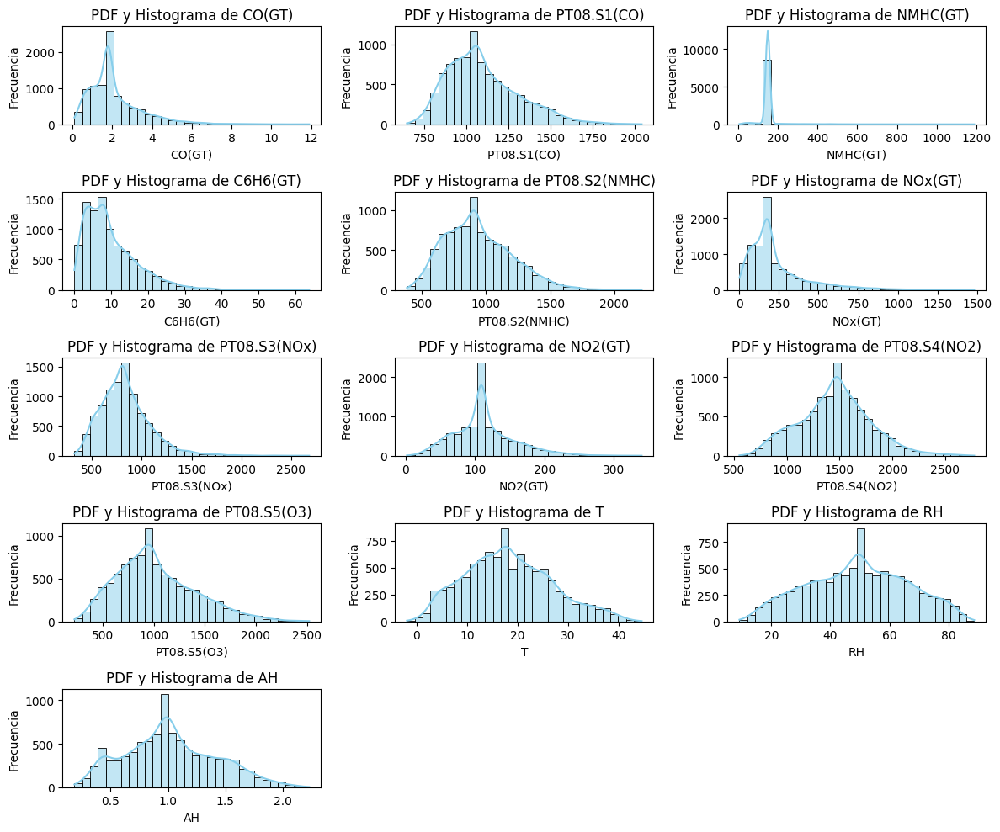

In [73]:
# Crear los gráficos de PDF e Histograma

plt.figure(figsize=(12, 10))
for i, col in enumerate(col_numericas_lim, 1):
    plt.subplot(5, 3, i)  # Ajustar la cantidad de subgráficos según el número de columnas
    sns.histplot(df_limpio[col], kde=True, bins=30, color='skyblue')
    plt.title(f'PDF y Histograma de {col}', fontsize=12)
    plt.xlabel(col, fontsize=10)
    plt.ylabel('Frecuencia', fontsize=10)

plt.tight_layout()
plt.show()

### De la columna Date obten el día de la Semana y realiza una gráfica de barras.

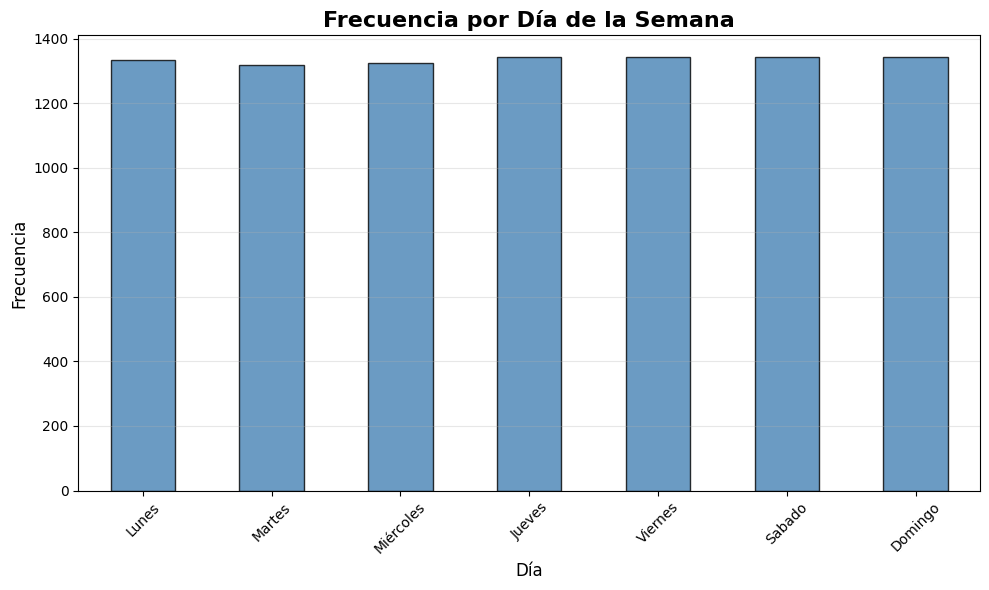

In [74]:
#Obtener el día de la semana
"""df_limpio['dia_semana'] = df_limpio['Date'].df.day_of_week

#Mapear los días de la semana a texto
dias_semana = {
    0: "Lunes",
    1: "Martes",
    2: "Miércoles",
    3: "Jueves",
    4: "Viernes",
    5: "Sabado",
    6: "Domingo",
}

df_limpio['dia_semana'] = df_limpio['dia_semana'].map(dias_semana)
"""
# Contar frecuencia por día
conteo = df_limpio['dia_semana'].value_counts().reindex(dias_semana.values())

# Grafico de barras
plt.figure(figsize=(10, 6))
conteo.plot(kind='bar', color='steelblue', edgecolor='black', alpha=0.8)
plt.title('Frecuencia por Día de la Semana', fontsize=16, weight='bold')
plt.xlabel('Día', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()


In [75]:
print(conteo)

dia_semana
Lunes        1335
Martes       1320
Miércoles    1326
Jueves       1344
Viernes      1344
Sabado       1344
Domingo      1344
Name: count, dtype: int64


### Boxplots para identificar outliers en las columnas numéricas.

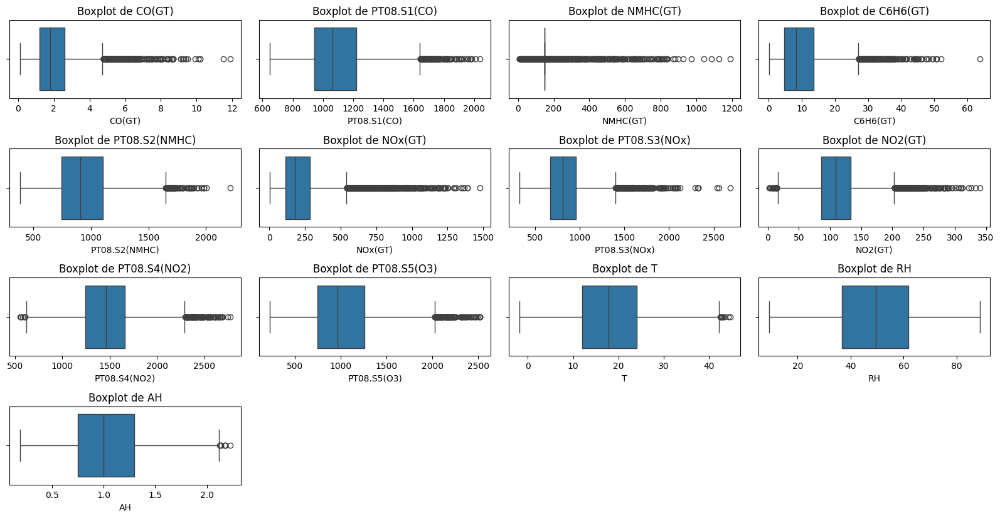

In [77]:
# Configurar el tamaño de la figura
plt.figure(figsize=(16, 10))

# Crear boxplots para cada columna numérica
for i, col in enumerate(col_numericas_lim, 1):
    plt.subplot(5, 4, i)  # 5 filas, 4 columnas de subplots
    sns.boxplot(x=df_limpio[col])
    plt.title(f'Boxplot de {col}')
plt.tight_layout()
plt.show()


### Matriz de correlación y mapa de calor.

Matriz de correlación:
                 CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  PT08.S2(NMHC)  \
CO(GT)         1.000000     0.776948  0.291053  0.808857       0.795959   
PT08.S1(CO)    0.776948     1.000000  0.306130  0.883871       0.892989   
NMHC(GT)       0.291053     0.306130  1.000000  0.270428       0.268074   
C6H6(GT)       0.808857     0.883871  0.270428  1.000000       0.981596   
PT08.S2(NMHC)  0.795959     0.892989  0.268074  0.981596       1.000000   
NOx(GT)        0.780463     0.622549  0.048855  0.616149       0.606179   
PT08.S3(NOx)  -0.619318    -0.770544 -0.190779 -0.733503      -0.795792   
NO2(GT)        0.656002     0.563442  0.121009  0.533313       0.561938   
PT08.S4(NO2)   0.548481     0.682363  0.257684  0.764578       0.776969   
PT08.S5(O3)    0.763513     0.899417  0.229190  0.865711       0.880633   
T              0.006049     0.048985  0.030171  0.199273       0.241556   
RH             0.041137     0.114400 -0.046864 -0.061812      -0.090450   
AH

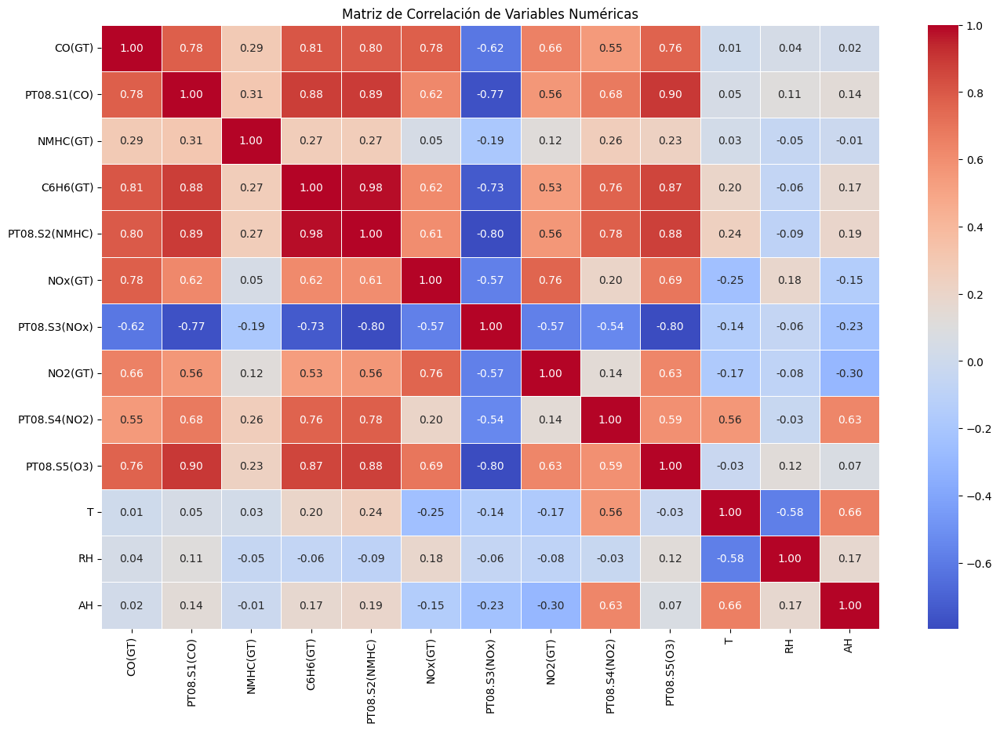

In [78]:
# Seleccionar solo las columnas numéricas
numeric_columns_lim = df_limpio.select_dtypes(include=[np.number])

# Calcular la matriz de correlación
corr_matrix = numeric_columns_lim.corr()

# Mostrar la matriz de correlación
print("Matriz de correlación:")
print(corr_matrix)

# Visualizar la matriz de correlación con un heatmap
plt.figure(figsize=(16, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Matriz de Correlación de Variables Numéricas')
plt.show()

### Pairplot para visualizar relaciones entre variables numéricas.

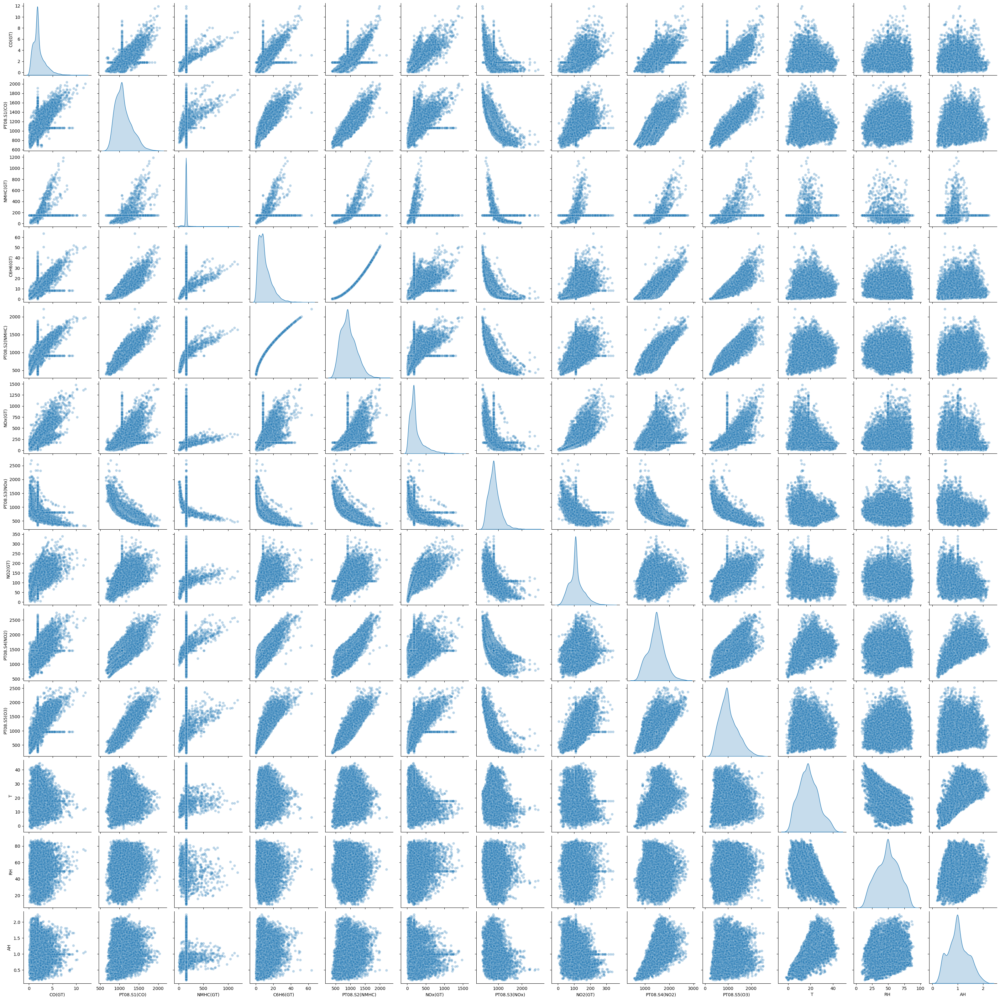

In [79]:
# Crear un scatterplot para todas las combinaciones de variables numéricas
sns.pairplot(df_limpio[col_numericas_lim], plot_kws={'alpha': 0.3}, diag_kind='kde')

# Mostrar el gráfico
plt.show()

### Pruebas de normalidad (Shapiro-Wilk, Anderson-Darling, Kolmogorov-Smirnov) y QQplot para las columnas numéricas.

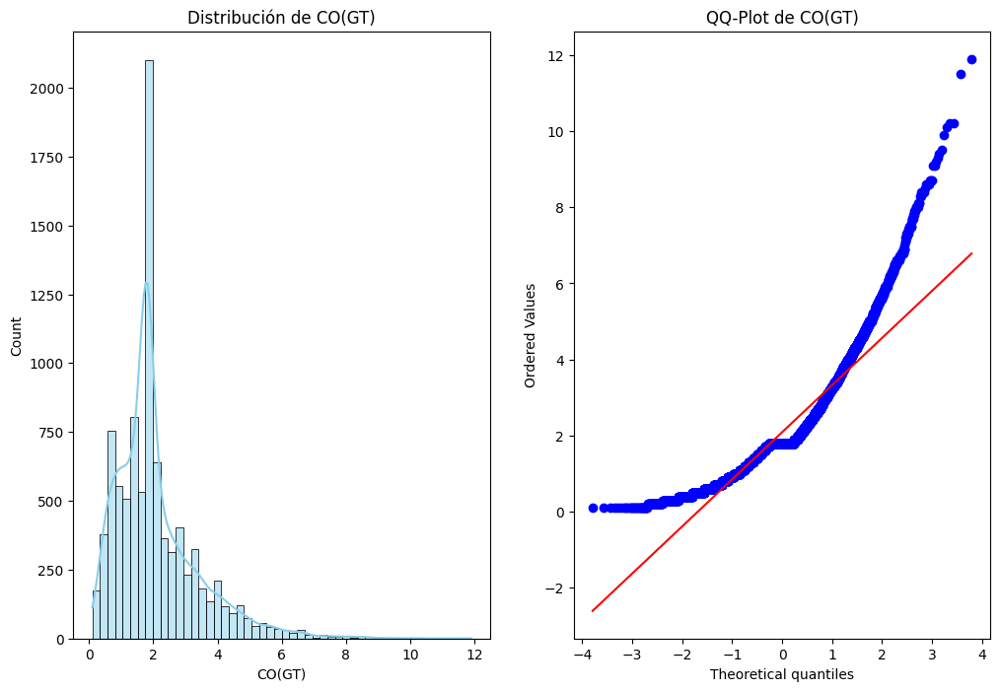


Pruebas de normalidad para la columna: CO(GT)
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 315.91164
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.


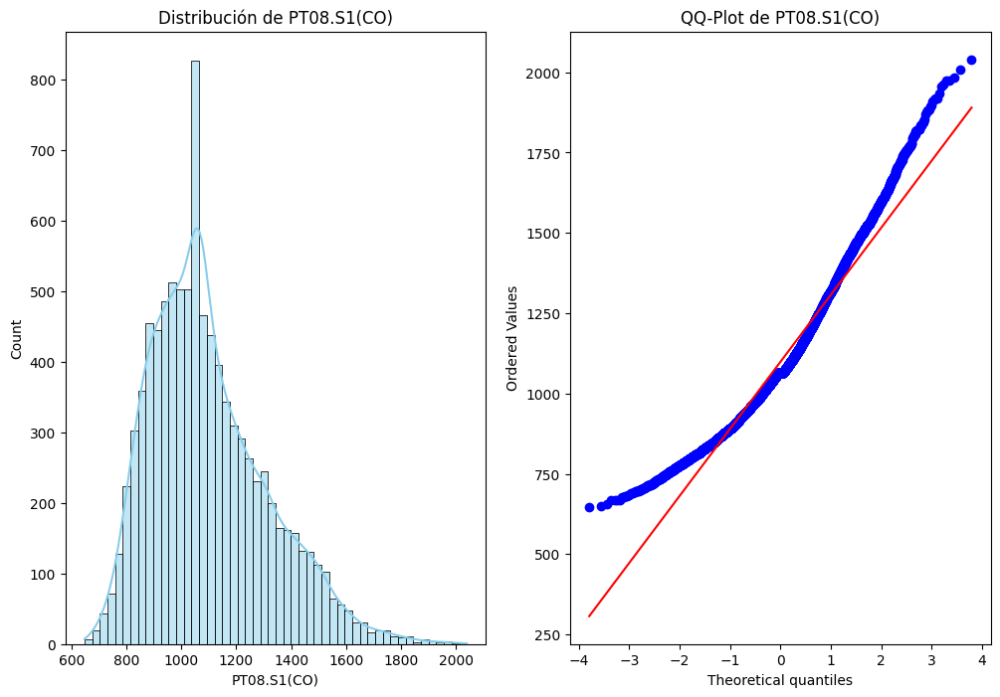


Pruebas de normalidad para la columna: PT08.S1(CO)
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 103.12601
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.


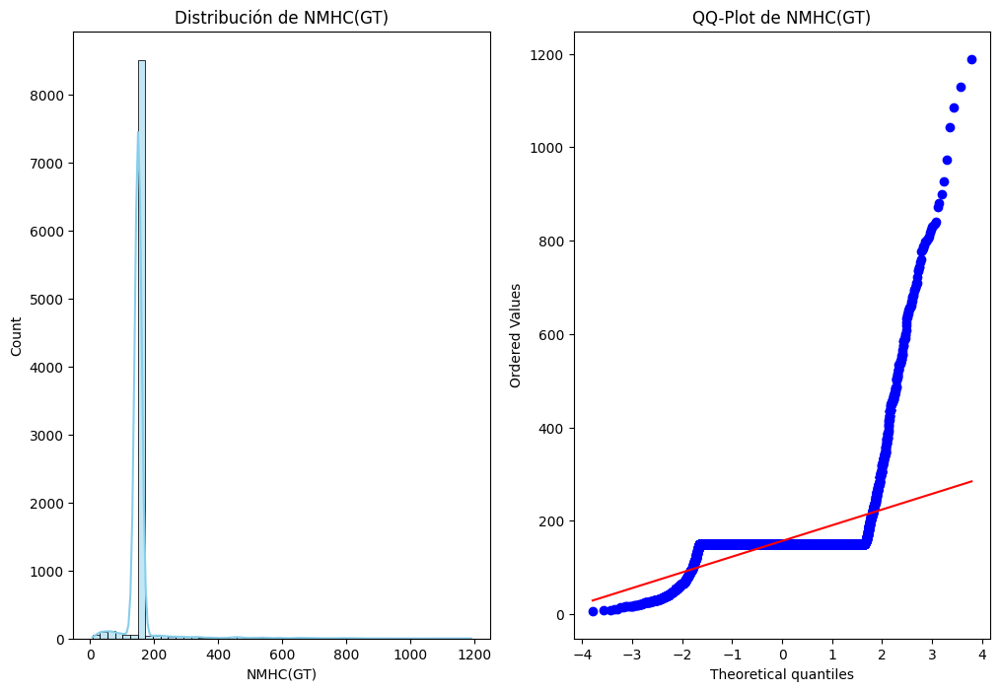


Pruebas de normalidad para la columna: NMHC(GT)
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 2808.06899
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.


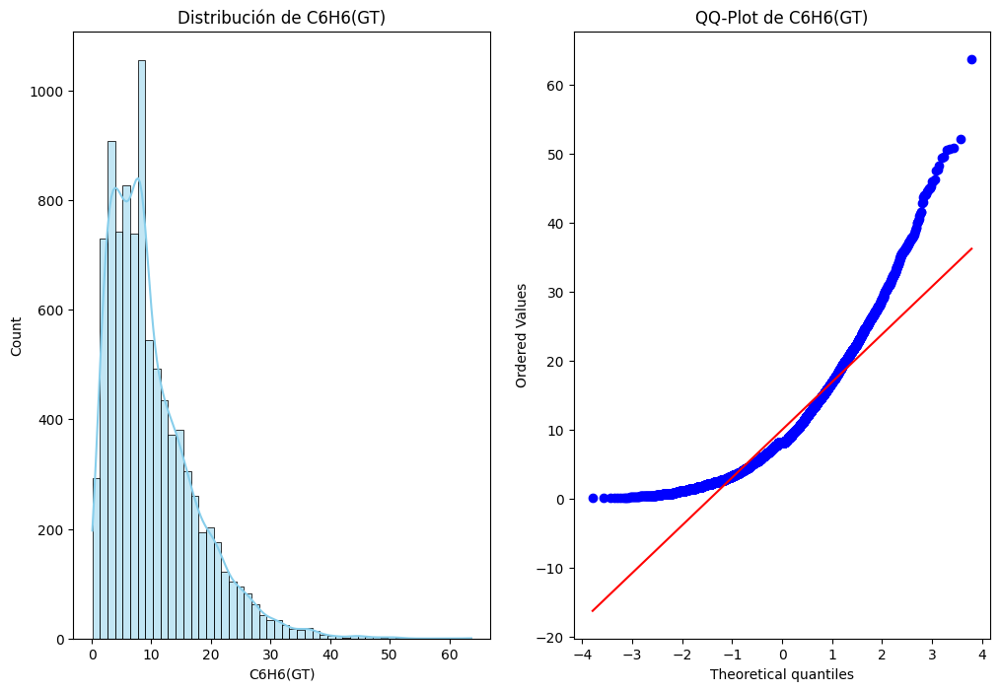


Pruebas de normalidad para la columna: C6H6(GT)
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 247.10194
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.


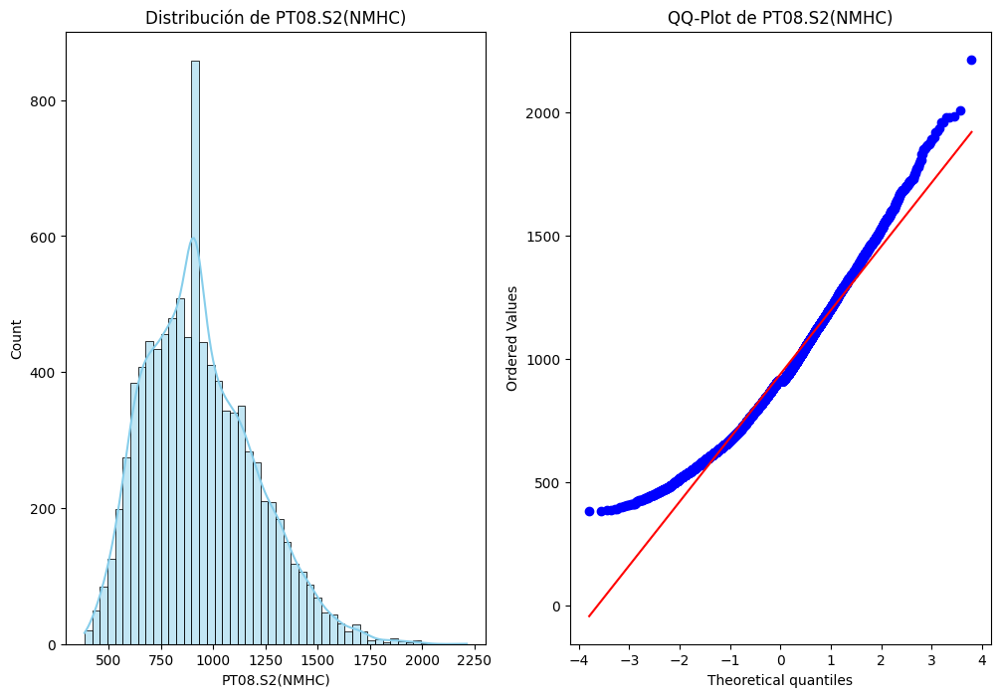


Pruebas de normalidad para la columna: PT08.S2(NMHC)
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 49.71409
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.


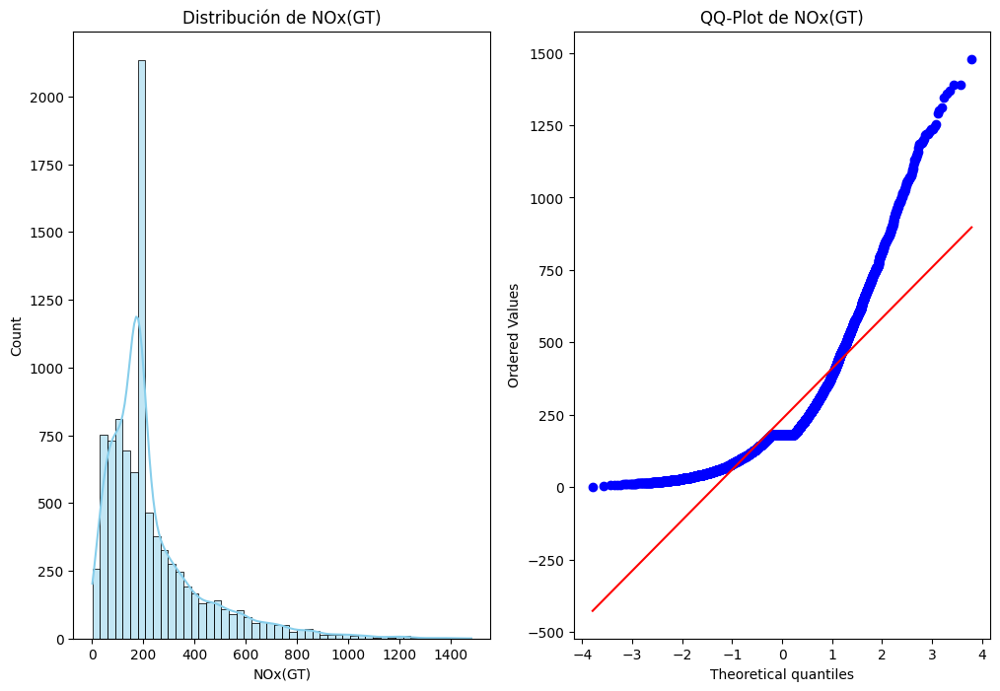


Pruebas de normalidad para la columna: NOx(GT)
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 559.57109
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.


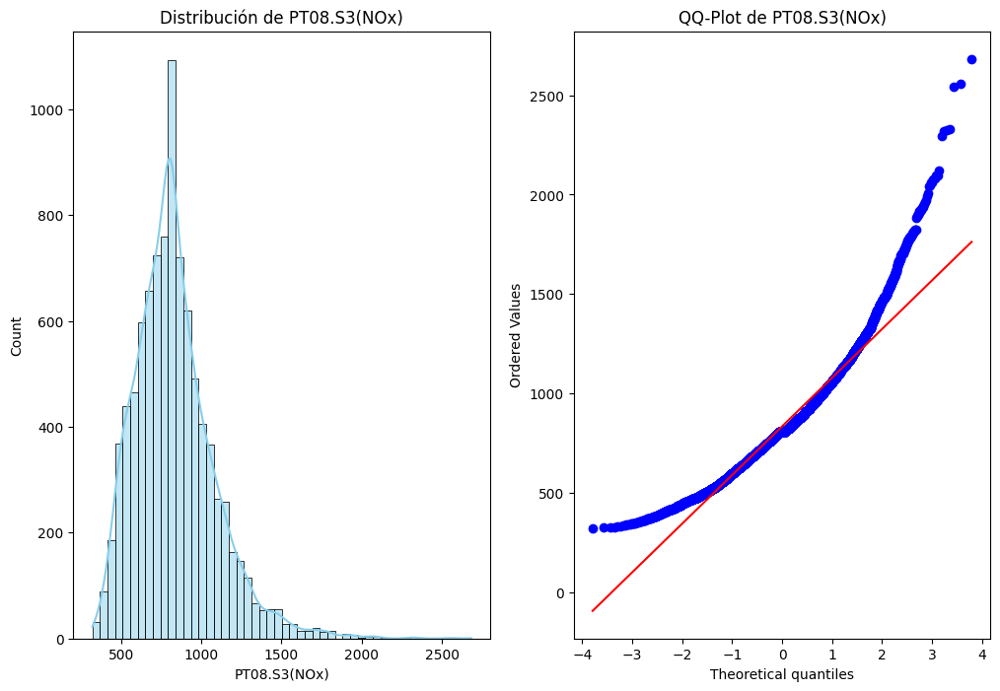


Pruebas de normalidad para la columna: PT08.S3(NOx)
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 87.97310
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.


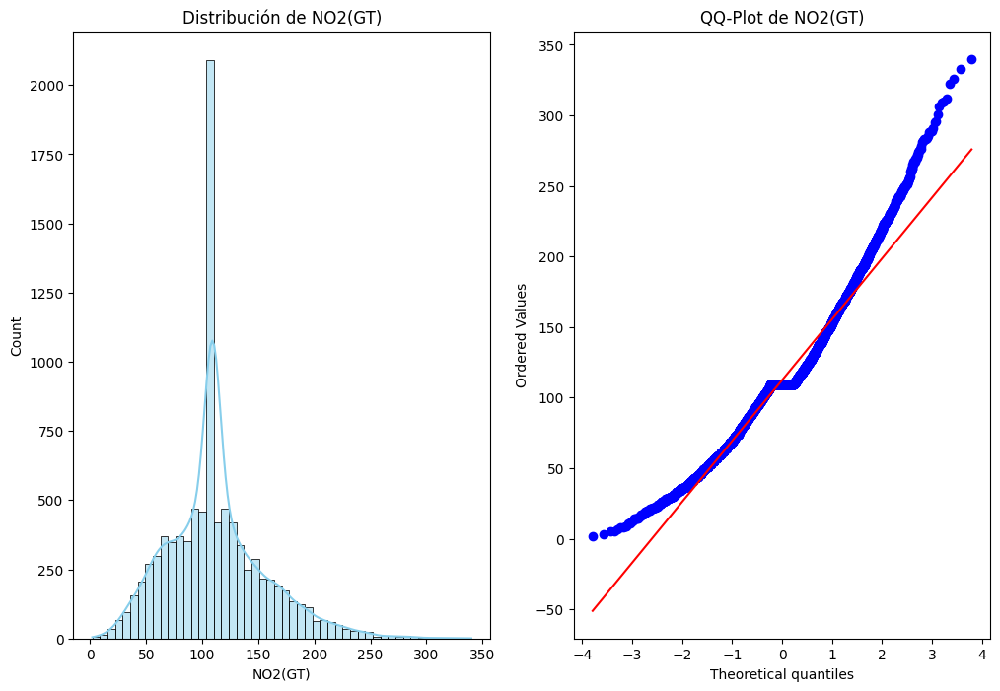


Pruebas de normalidad para la columna: NO2(GT)
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 122.29970
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.


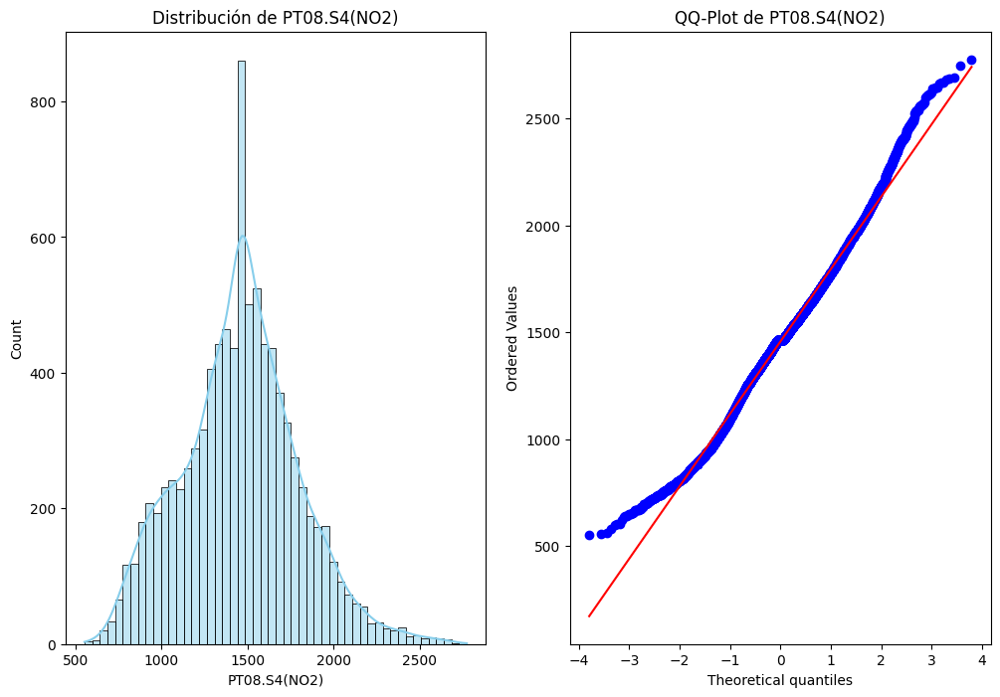


Pruebas de normalidad para la columna: PT08.S4(NO2)
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 14.29705
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.


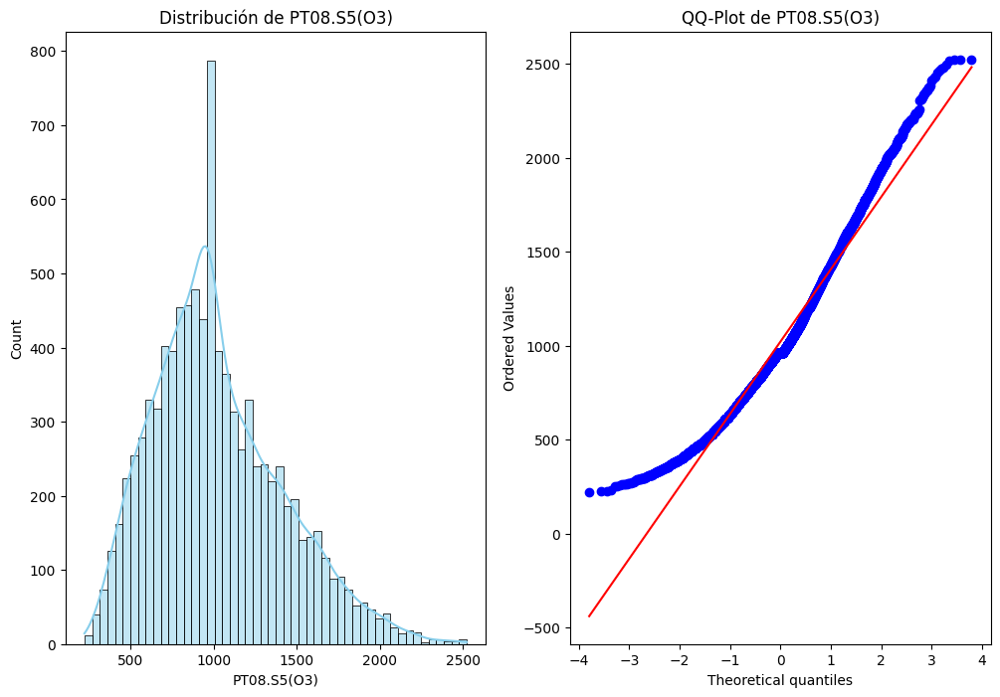


Pruebas de normalidad para la columna: PT08.S5(O3)
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 73.27645
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.


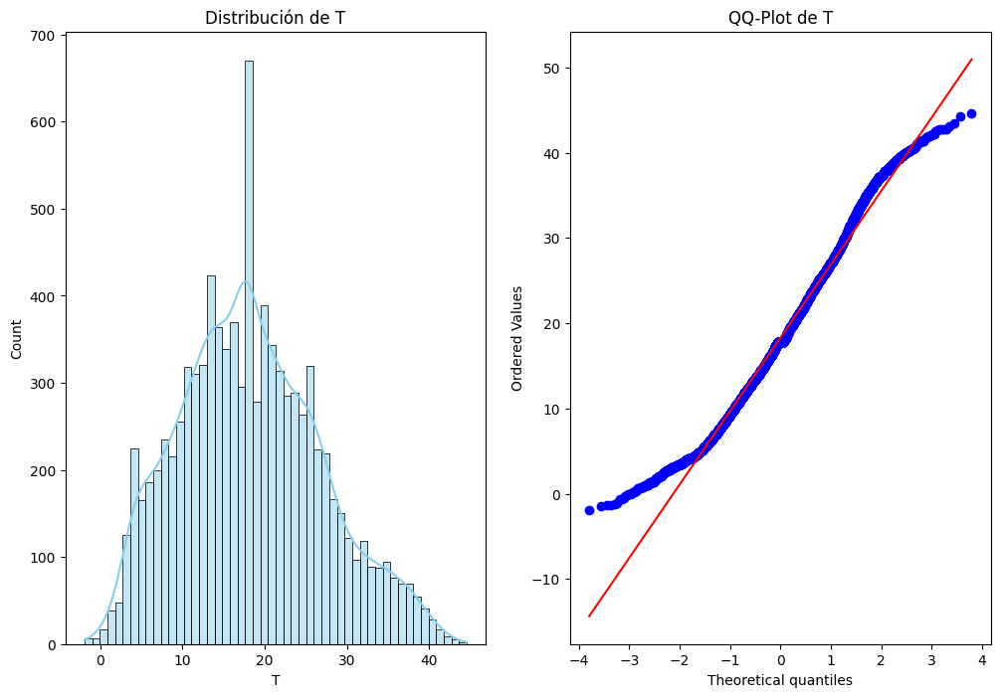


Pruebas de normalidad para la columna: T
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 21.92645
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.


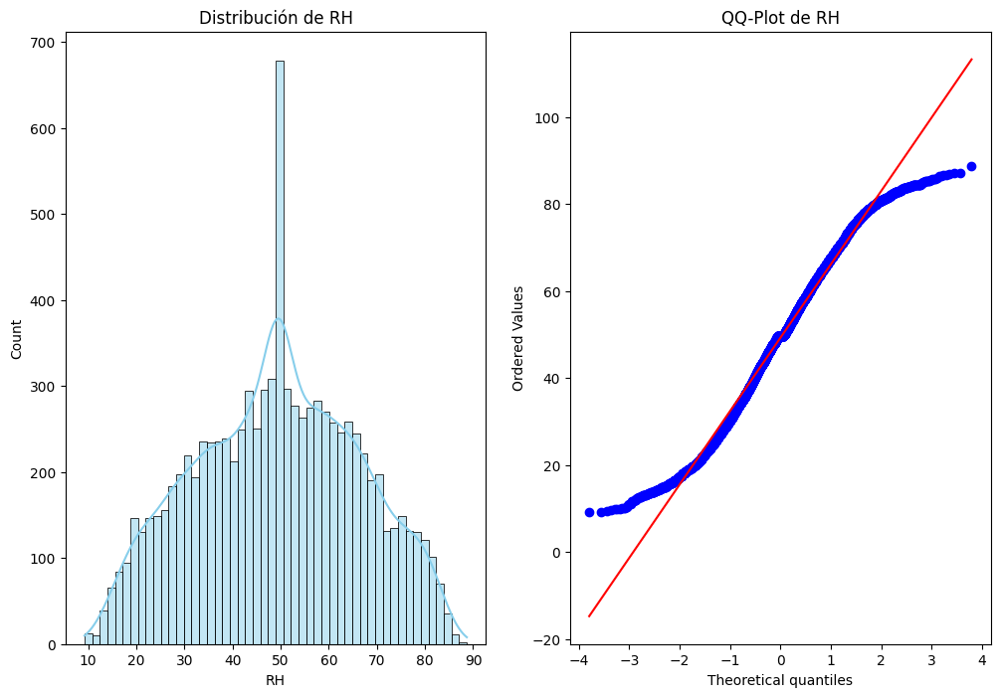


Pruebas de normalidad para la columna: RH
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 20.58979
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.


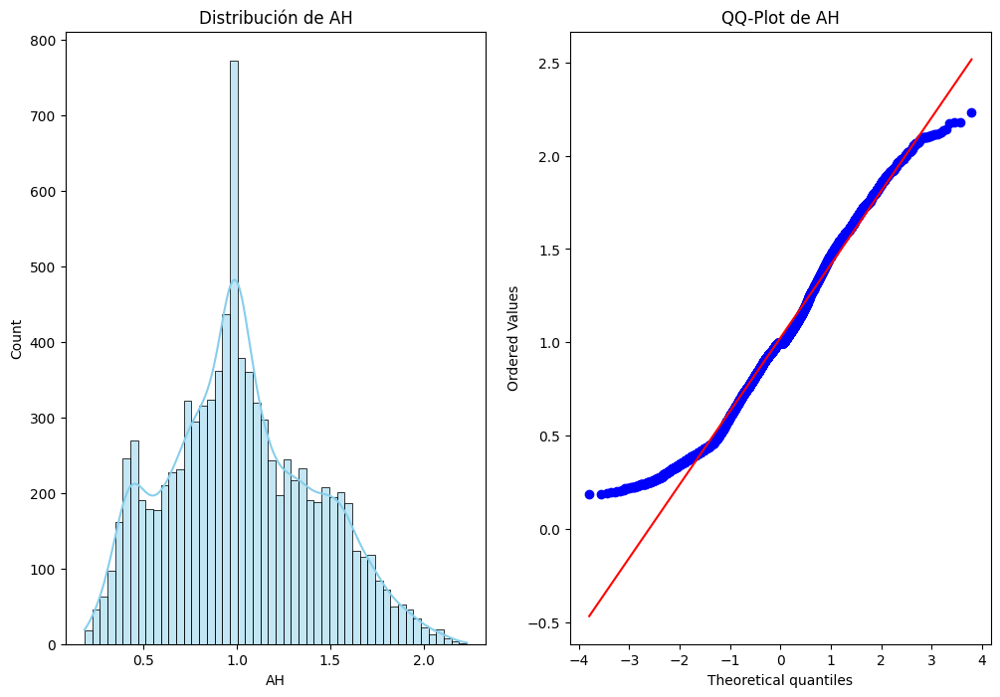


Pruebas de normalidad para la columna: AH
Shapiro-Wilk Test: p-valor = 0.00000
Kolmogorov-Smirnov Test: p-valor = 0.00000
Anderson-Darling Test: Estadístico = 30.76443
  Al nivel de significancia 15.0%, los datos NO parecen normales.
  Al nivel de significancia 10.0%, los datos NO parecen normales.
  Al nivel de significancia 5.0%, los datos NO parecen normales.
  Al nivel de significancia 2.5%, los datos NO parecen normales.
  Al nivel de significancia 1.0%, los datos NO parecen normales.


In [80]:
#===================================
#FUNCIONES DE PRUEBAS DE NORMALIDAD#
#===================================

# Función para realizar pruebas de normalidad
def normality_tests(data, column_name):
    print(f"\nPruebas de normalidad para la columna: {column_name}")

    # Prueba de Shapiro-Wilk
    shapiro_test = stats.shapiro(data.sample(min(5000, len(data)), random_state=42))  # Muestra de 5000 para evitar problemas de cómputo
    print(f"Shapiro-Wilk Test: p-valor = {shapiro_test.pvalue:.5f}")

    # Prueba de Kolmogorov-Smirnov
    ks_test = stats.kstest(data, 'norm', args=(data.mean(), data.std()))
    print(f"Kolmogorov-Smirnov Test: p-valor = {ks_test.pvalue:.5f}")

    # Prueba de Anderson-Darling
    anderson_test = stats.anderson(data, dist='norm')
    print(f"Anderson-Darling Test: Estadístico = {anderson_test.statistic:.5f}")
    for i in range(len(anderson_test.critical_values)):
        sl, cv = anderson_test.significance_level[i], anderson_test.critical_values[i]
        if anderson_test.statistic < cv:
            print(f"  Al nivel de significancia {sl}%, los datos parecen normales.")
        else:
            print(f"  Al nivel de significancia {sl}%, los datos NO parecen normales.")

# Función para graficar histograma y QQ-Plot
def plot_distribution(data, column_name):
    plt.figure(figsize=(12, 8))

    # Histograma
    plt.subplot(1, 2, 1)
    sns.histplot(data, bins=50, kde=True, color="skyblue")
    plt.title(f"Distribución de {column_name}")

    # QQ-Plot
    plt.subplot(1, 2, 2)
    stats.probplot(data, dist="norm", plot=plt)
    plt.title(f"QQ-Plot de {column_name}")
    plt.show()

#===USO DE FUNCIONES DE NORMALIDAD===
for column in numeric_columns_lim:
    data = df_limpio[column]
    plot_distribution(data, column)
    normality_tests(data, column)

